In [1]:
import tensorflow as tf
import os
import tensorflow as tf
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import RMSprop
import matplotlib.pyplot as plt
from tensorflow.keras.layers import BatchNormalization

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
base_dir = '/content/drive/My Drive/dataset/'

#Directories for each class
train_dir = f'{base_dir}/train'
validation_dir = f'{base_dir}/valid'

In [ ]:
train_datagen = ImageDataGenerator(
        rescale=1./255,
        rotation_range=40,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        brightness_range=[0.8, 1.2],
        fill_mode='nearest'
    )

# YOUR IMAGE SIZE SHOULD BE 150x150
train_generator = train_datagen.flow_from_directory(directory=train_dir,
                                                        batch_size=32,
                                                        class_mode='categorical',
                                                        target_size=(150, 150))

validation_datagen = ImageDataGenerator(rescale=1./255)

# Pass in the appropriate arguments to the flow_from_directory method
validation_generator = validation_datagen.flow_from_directory(directory=validation_dir,
                                                                  batch_size=16,
                                                                  class_mode='categorical',
                                                                  target_size=(150, 150))


Found 350 images belonging to 5 classes.
Found 100 images belonging to 5 classes.


In [ ]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(64, (3,3), activation='relu', input_shape=(150, 150, 3)),
    #tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(2, 2),

    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    #tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
    #tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(256, (3,3), activation='relu'),
    #tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Conv2D(256, (3,3), activation='relu'),
    #tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(521, activation='relu',),
    #tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(5, activation='softmax')
])

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 148, 148, 64)      1792      
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 74, 74, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_6 (Conv2D)           (None, 72, 72, 64)        36928     
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 36, 36, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_7 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 17, 17, 128)      

In [ ]:
class myCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs={}):
       if logs.get('accuracy') > 0.84 and logs.get('val_accuracy') > 0.84 and logs.get('loss') < 0.7 and logs.get('val_loss') < 0.7:
            print("\nReached 85% accuracy, stopping training!")
            self.model.stop_training = True

callbacks = myCallback()

In [ ]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

#model.compile(optimizer=RMSprop(learning_rate=0.0005),
#              loss='categorical_crossentropy',
#              metrics=['accuracy'])

In [ ]:
history = model.fit(
              train_generator,
              validation_data=validation_generator,
              epochs=200,
              verbose=1,
              callbacks=[callbacks]
          )

Epoch 1/200
11/11 [==============================] - 211s 21s/step - loss: 1.6114 - accuracy: 0.2714 - val_loss: 1.5929 - val_accuracy: 0.3600
Epoch 2/200
11/11 [==============================] - 32s 3s/step - loss: 1.5840 - accuracy: 0.3257 - val_loss: 1.5457 - val_accuracy: 0.5200
Epoch 3/200
11/11 [==============================] - 32s 3s/step - loss: 1.5084 - accuracy: 0.4343 - val_loss: 1.3776 - val_accuracy: 0.5000
Epoch 4/200
11/11 [==============================] - 32s 3s/step - loss: 1.2982 - accuracy: 0.4800 - val_loss: 1.1130 - val_accuracy: 0.6300
Epoch 5/200
11/11 [==============================] - 35s 3s/step - loss: 1.1532 - accuracy: 0.4686 - val_loss: 1.0187 - val_accuracy: 0.6400
Epoch 6/200
11/11 [==============================] - 42s 4s/step - loss: 1.1139 - accuracy: 0.4743 - val_loss: 1.0418 - val_accuracy: 0.5900
Epoch 7/200
11/11 [==============================] - 32s 3s/step - loss: 1.1323 - accuracy: 0.4914 - val_loss: 1.0391 - val_accuracy: 0.5200
Epoch 8/200

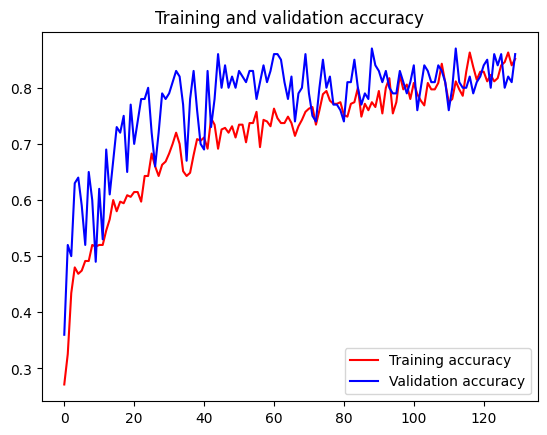

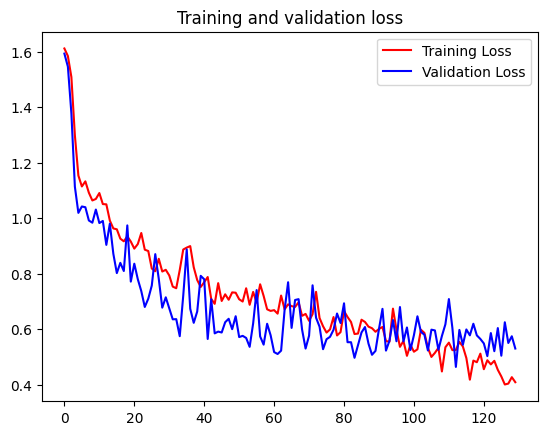

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()

plt.plot(epochs, loss, 'r', label='Training Loss')
plt.plot(epochs, val_loss, 'b', label='Validation Loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from PIL import Image
import io

def preprocess_image(uploaded_file):
    img = Image.open(uploaded_file)
    img = img.resize((150, 150))  # Resize the image to 150x150 pixels
    img_array = image.img_to_array(img)  # Convert the image to a numpy array
    img_array = np.expand_dims(img_array, axis=0)  # Add a batch dimension
    img_array /= 255.0  # Normalize the image array
    return img_array



In [7]:
from tensorflow.keras.models import load_model

model = load_model('model_food_detection.h5')

c:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [4]:
def make_prediction(uploaded_file):
    img_array = preprocess_image(uploaded_file)
    prediction = model.predict(img_array)
    return prediction

In [5]:
def display_calories(predicted_class):
    food_item = class_labels[predicted_class]
    calorie_count = calories[food_item]
    print(f'The predicted food is {food_item} with approximately {calorie_count} calories per 100g.')

Processing images in folder: dataset/test/ayam


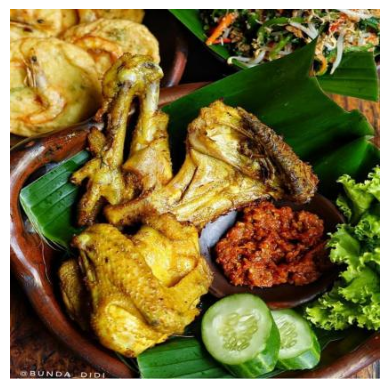

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step
The image in folder dataset/test/ayam is predicted to be ayam with a confidence of 0.52
The predicted food is ayam with approximately 239 calories per 100g.


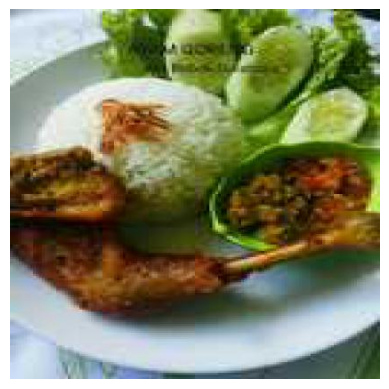

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
The image in folder dataset/test/ayam is predicted to be ayam with a confidence of 0.63
The predicted food is ayam with approximately 239 calories per 100g.


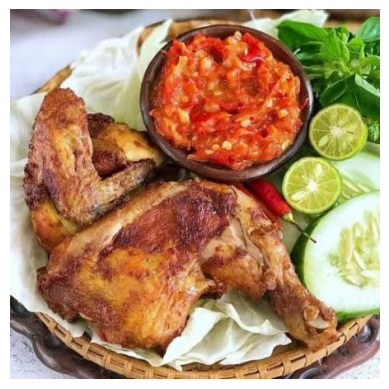

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
The image in folder dataset/test/ayam is predicted to be ayam with a confidence of 0.89
The predicted food is ayam with approximately 239 calories per 100g.


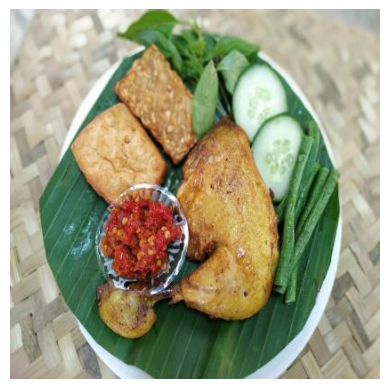

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
The image in folder dataset/test/ayam is predicted to be tahu with a confidence of 0.72
The predicted food is tahu with approximately 76 calories per 100g.


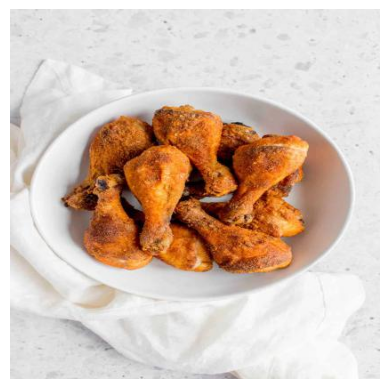

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
The image in folder dataset/test/ayam is predicted to be ayam with a confidence of 0.86
The predicted food is ayam with approximately 239 calories per 100g.


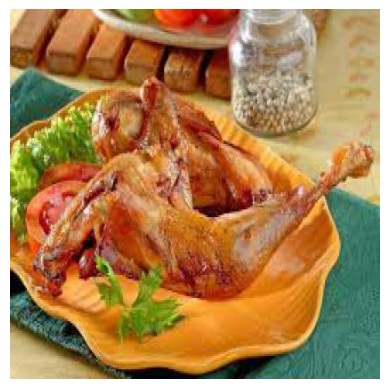

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
The image in folder dataset/test/ayam is predicted to be ayam with a confidence of 0.66
The predicted food is ayam with approximately 239 calories per 100g.


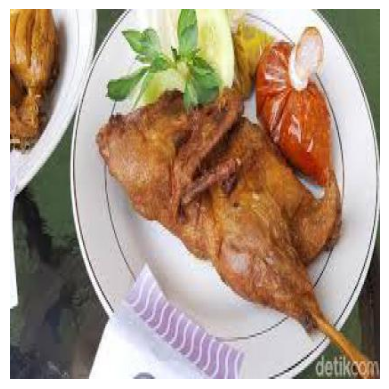

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
The image in folder dataset/test/ayam is predicted to be ayam with a confidence of 0.81
The predicted food is ayam with approximately 239 calories per 100g.


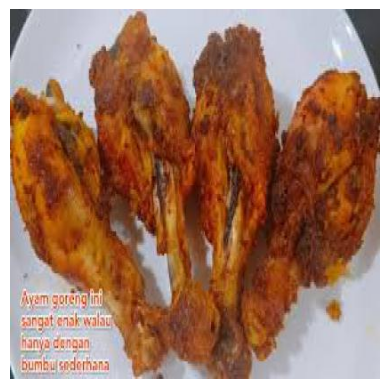

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
The image in folder dataset/test/ayam is predicted to be ayam with a confidence of 0.98
The predicted food is ayam with approximately 239 calories per 100g.


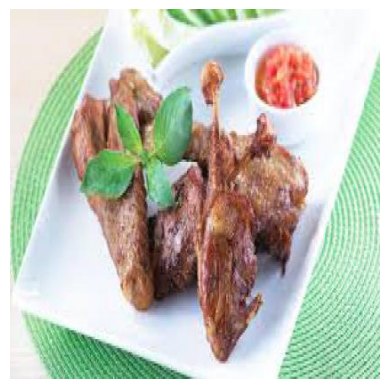

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
The image in folder dataset/test/ayam is predicted to be ayam with a confidence of 0.50
The predicted food is ayam with approximately 239 calories per 100g.
Processing images in folder: dataset/test/nasi


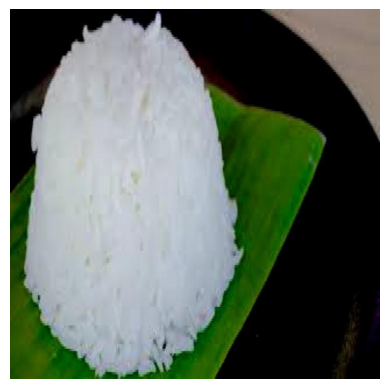

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
The image in folder dataset/test/nasi is predicted to be nasi with a confidence of 0.98
The predicted food is nasi with approximately 130 calories per 100g.


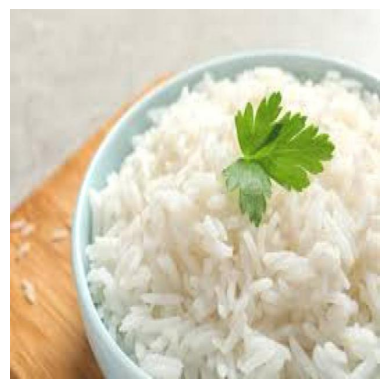

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
The image in folder dataset/test/nasi is predicted to be nasi with a confidence of 0.99
The predicted food is nasi with approximately 130 calories per 100g.


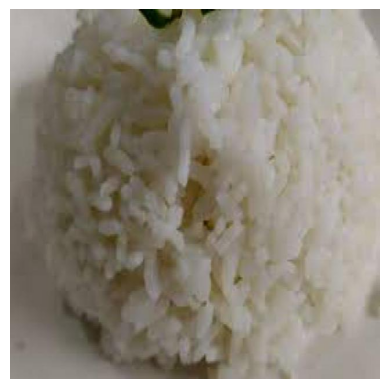

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
The image in folder dataset/test/nasi is predicted to be nasi with a confidence of 0.72
The predicted food is nasi with approximately 130 calories per 100g.


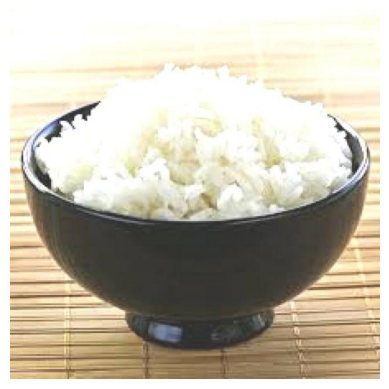

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
The image in folder dataset/test/nasi is predicted to be nasi with a confidence of 0.98
The predicted food is nasi with approximately 130 calories per 100g.


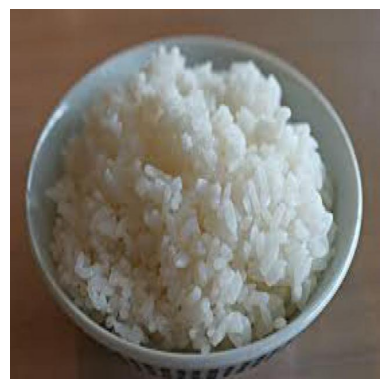

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
The image in folder dataset/test/nasi is predicted to be nasi with a confidence of 0.93
The predicted food is nasi with approximately 130 calories per 100g.


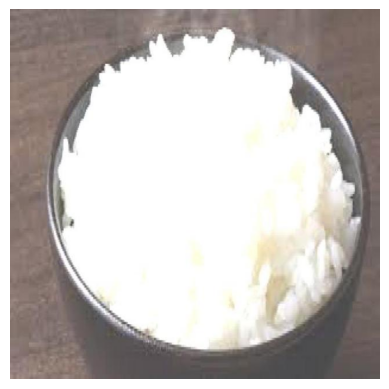

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
The image in folder dataset/test/nasi is predicted to be nasi with a confidence of 1.00
The predicted food is nasi with approximately 130 calories per 100g.


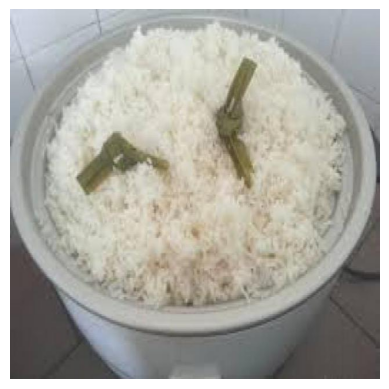

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
The image in folder dataset/test/nasi is predicted to be nasi with a confidence of 1.00
The predicted food is nasi with approximately 130 calories per 100g.


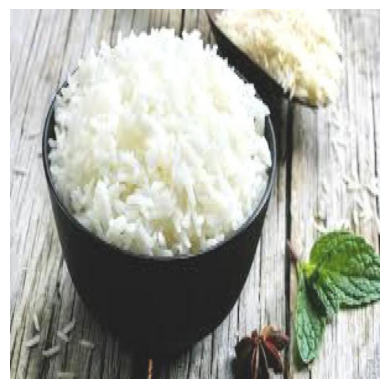

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
The image in folder dataset/test/nasi is predicted to be nasi with a confidence of 0.99
The predicted food is nasi with approximately 130 calories per 100g.


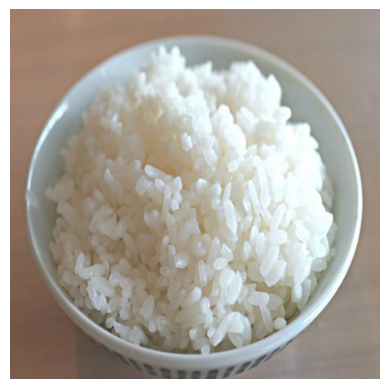

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
The image in folder dataset/test/nasi is predicted to be nasi with a confidence of 0.99
The predicted food is nasi with approximately 130 calories per 100g.


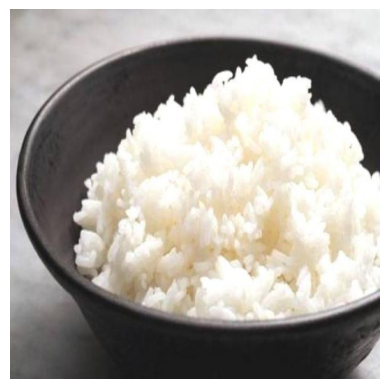

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
The image in folder dataset/test/nasi is predicted to be nasi with a confidence of 1.00
The predicted food is nasi with approximately 130 calories per 100g.
Processing images in folder: dataset/test/tahu


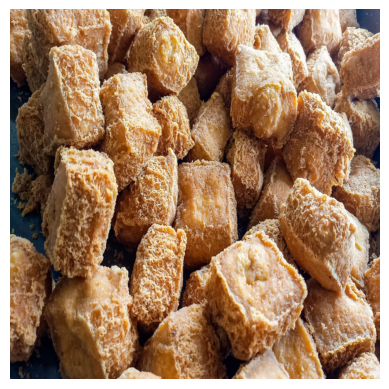

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
The image in folder dataset/test/tahu is predicted to be ayam with a confidence of 0.97
The predicted food is ayam with approximately 239 calories per 100g.


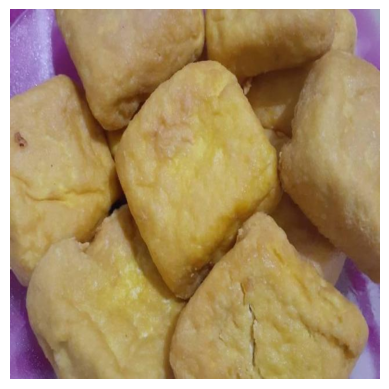

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
The image in folder dataset/test/tahu is predicted to be tahu with a confidence of 0.82
The predicted food is tahu with approximately 76 calories per 100g.


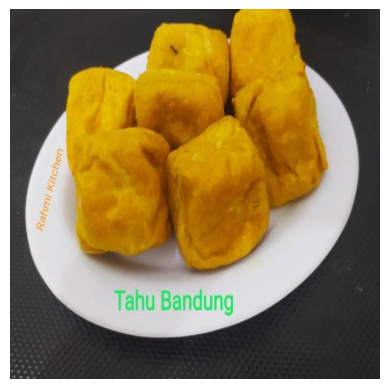

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
The image in folder dataset/test/tahu is predicted to be tahu with a confidence of 0.83
The predicted food is tahu with approximately 76 calories per 100g.


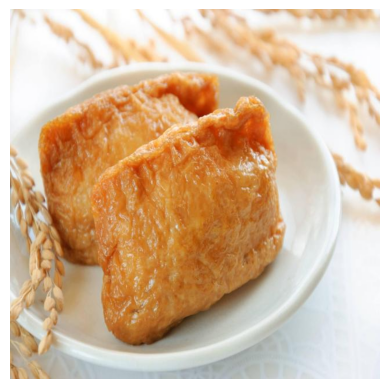

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
The image in folder dataset/test/tahu is predicted to be tempe with a confidence of 0.83
The predicted food is tempe with approximately 192 calories per 100g.


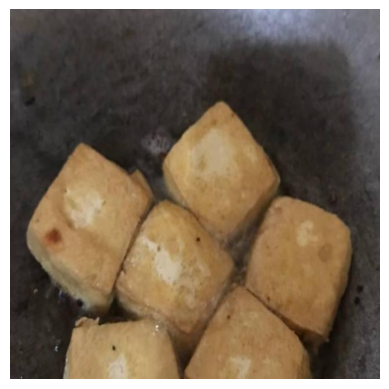

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
The image in folder dataset/test/tahu is predicted to be tahu with a confidence of 0.63
The predicted food is tahu with approximately 76 calories per 100g.


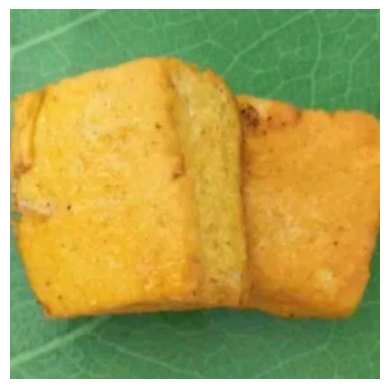

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
The image in folder dataset/test/tahu is predicted to be tahu with a confidence of 0.75
The predicted food is tahu with approximately 76 calories per 100g.


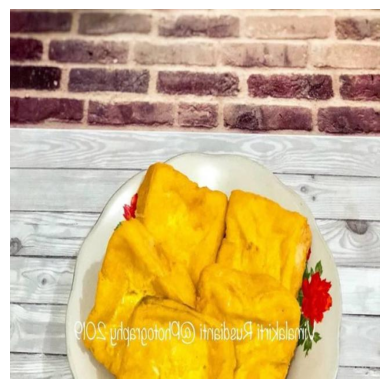

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
The image in folder dataset/test/tahu is predicted to be tahu with a confidence of 0.89
The predicted food is tahu with approximately 76 calories per 100g.


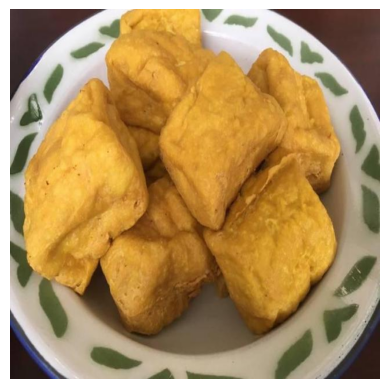

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
The image in folder dataset/test/tahu is predicted to be tahu with a confidence of 0.53
The predicted food is tahu with approximately 76 calories per 100g.


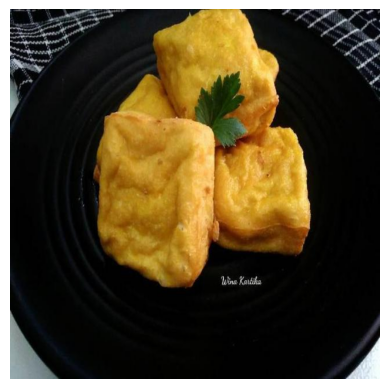

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
The image in folder dataset/test/tahu is predicted to be tahu with a confidence of 0.83
The predicted food is tahu with approximately 76 calories per 100g.


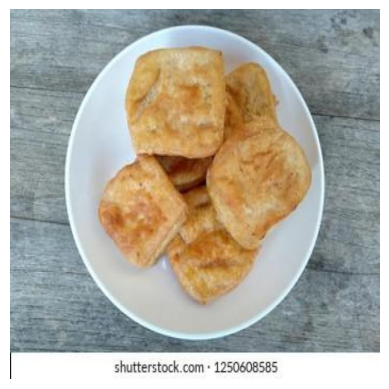

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
The image in folder dataset/test/tahu is predicted to be tahu with a confidence of 0.83
The predicted food is tahu with approximately 76 calories per 100g.
Processing images in folder: dataset/test/telur


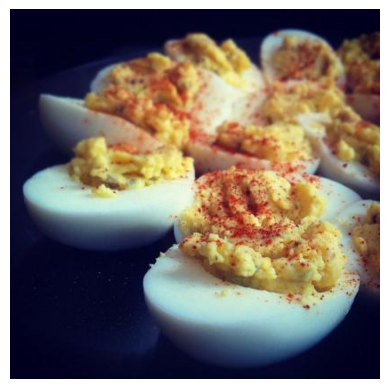

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
The image in folder dataset/test/telur is predicted to be telur with a confidence of 0.83
The predicted food is telur with approximately 155 calories per 100g.


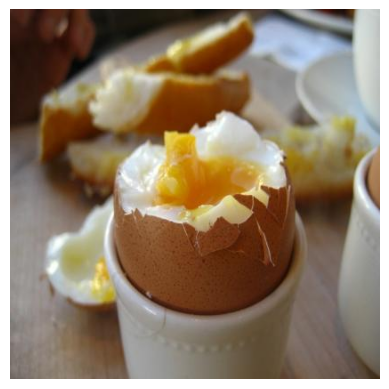

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
The image in folder dataset/test/telur is predicted to be telur with a confidence of 0.99
The predicted food is telur with approximately 155 calories per 100g.


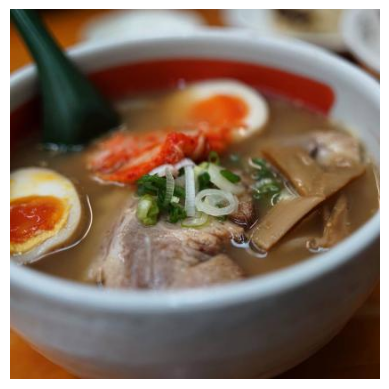

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
The image in folder dataset/test/telur is predicted to be telur with a confidence of 0.75
The predicted food is telur with approximately 155 calories per 100g.


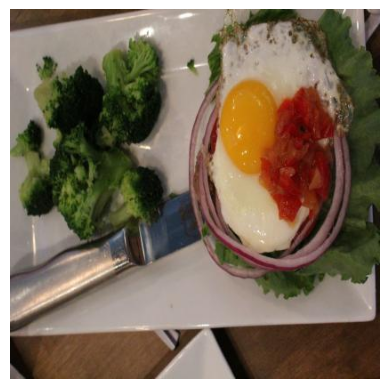

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
The image in folder dataset/test/telur is predicted to be telur with a confidence of 0.97
The predicted food is telur with approximately 155 calories per 100g.


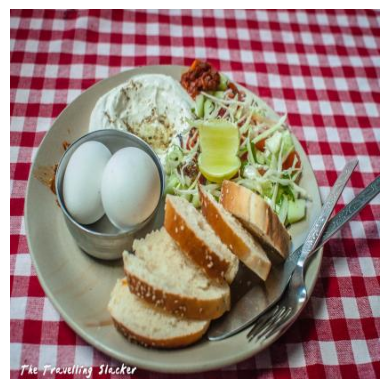

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
The image in folder dataset/test/telur is predicted to be telur with a confidence of 0.97
The predicted food is telur with approximately 155 calories per 100g.


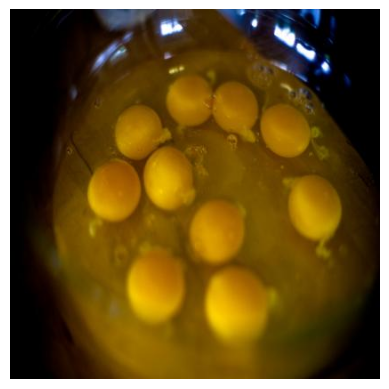

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
The image in folder dataset/test/telur is predicted to be tahu with a confidence of 0.66
The predicted food is tahu with approximately 76 calories per 100g.


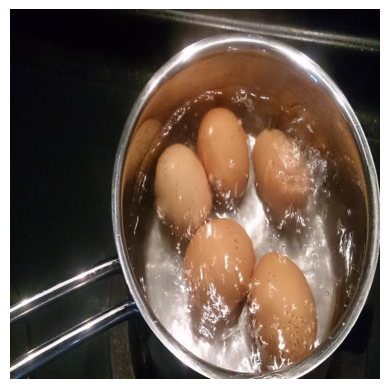

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
The image in folder dataset/test/telur is predicted to be ayam with a confidence of 0.37
The predicted food is ayam with approximately 239 calories per 100g.


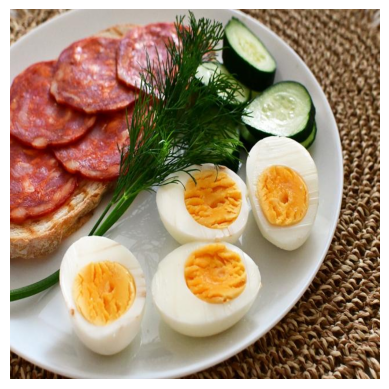

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
The image in folder dataset/test/telur is predicted to be telur with a confidence of 1.00
The predicted food is telur with approximately 155 calories per 100g.


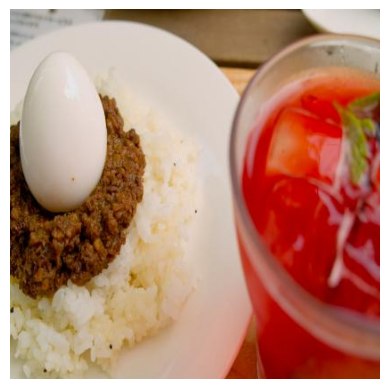

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
The image in folder dataset/test/telur is predicted to be telur with a confidence of 0.48
The predicted food is telur with approximately 155 calories per 100g.


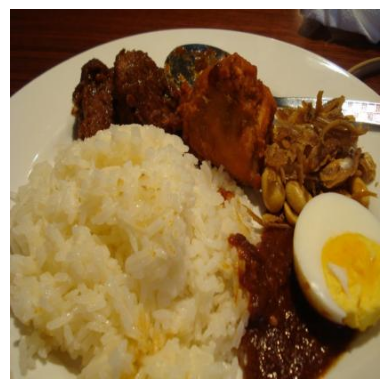

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
The image in folder dataset/test/telur is predicted to be tahu with a confidence of 0.71
The predicted food is tahu with approximately 76 calories per 100g.
Processing images in folder: dataset/test/tempe


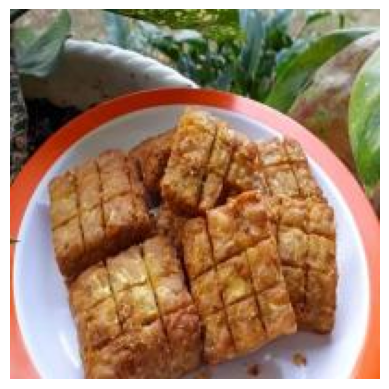

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
The image in folder dataset/test/tempe is predicted to be tempe with a confidence of 0.56
The predicted food is tempe with approximately 192 calories per 100g.


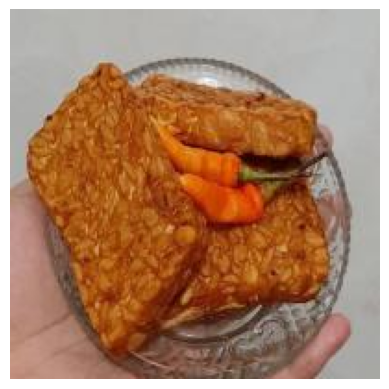

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
The image in folder dataset/test/tempe is predicted to be tempe with a confidence of 0.82
The predicted food is tempe with approximately 192 calories per 100g.


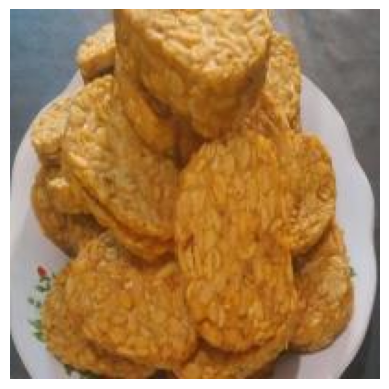

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
The image in folder dataset/test/tempe is predicted to be tempe with a confidence of 0.97
The predicted food is tempe with approximately 192 calories per 100g.


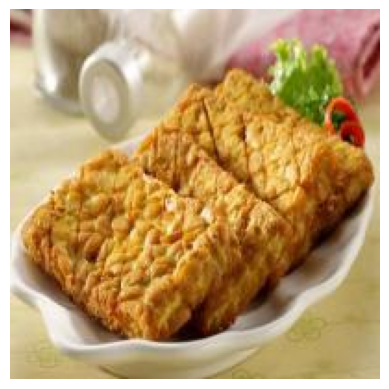

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
The image in folder dataset/test/tempe is predicted to be tempe with a confidence of 0.99
The predicted food is tempe with approximately 192 calories per 100g.


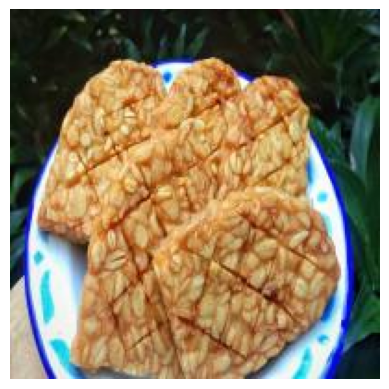

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
The image in folder dataset/test/tempe is predicted to be tempe with a confidence of 0.91
The predicted food is tempe with approximately 192 calories per 100g.


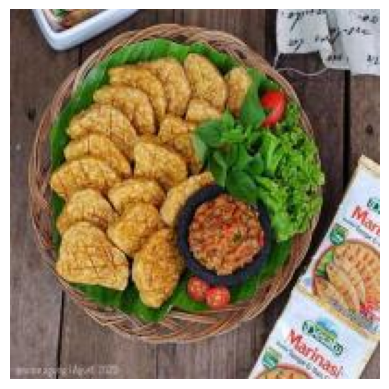

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
The image in folder dataset/test/tempe is predicted to be tempe with a confidence of 0.91
The predicted food is tempe with approximately 192 calories per 100g.


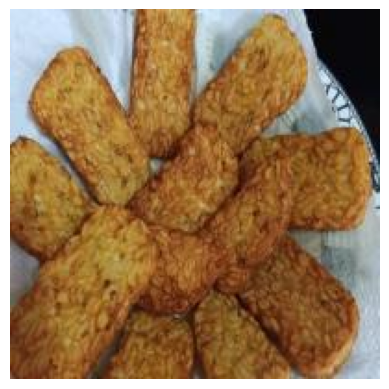

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
The image in folder dataset/test/tempe is predicted to be tempe with a confidence of 0.79
The predicted food is tempe with approximately 192 calories per 100g.


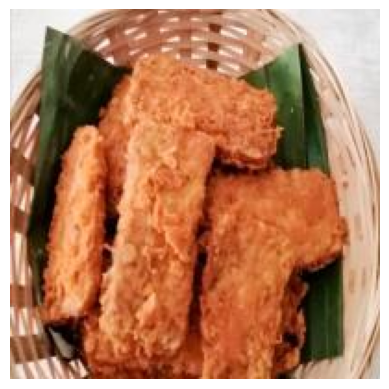

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
The image in folder dataset/test/tempe is predicted to be tempe with a confidence of 0.93
The predicted food is tempe with approximately 192 calories per 100g.


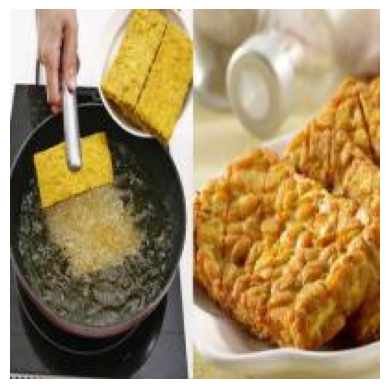

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
The image in folder dataset/test/tempe is predicted to be ayam with a confidence of 0.42
The predicted food is ayam with approximately 239 calories per 100g.


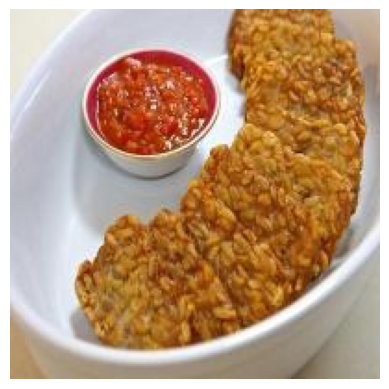

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
The image in folder dataset/test/tempe is predicted to be tempe with a confidence of 0.71
The predicted food is tempe with approximately 192 calories per 100g.

Summary of Predictions:
ayam: Total: 9, Correct: 8, Accuracy: 88.89%
nasi: Total: 10, Correct: 10, Accuracy: 100.00%
tahu: Total: 10, Correct: 8, Accuracy: 80.00%
telur: Total: 10, Correct: 7, Accuracy: 70.00%
tempe: Total: 10, Correct: 9, Accuracy: 90.00%


In [8]:
class_labels = ['ayam','nasi', 'tahu', 'telur', 'tempe']

calories = {
    'ayam': 239,  # calories per 100g
    'nasi': 130,  
    'tahu': 76,   
    'telur': 155, 
    'tempe': 192  
}

folder_paths = ["dataset/test/ayam","dataset/test/nasi", "dataset/test/tahu", "dataset/test/telur", "dataset/test/tempe"]

class_results = {class_label: {'total': 0, 'correct': 0} for class_label in class_labels}

# Iterate through each folder
for folder_path, label in zip(folder_paths, class_labels):
    print(f"Processing images in folder: {folder_path}")

    # Check if the folder exists
    if os.path.exists(folder_path):
        # Iterate through each file in the folder
        for filename in os.listdir(folder_path):
            file_path = os.path.join(folder_path, filename)

            # Check if the file is an image file
            if file_path.endswith(".jpg") or file_path.endswith(".jpeg") or file_path.endswith(".png"):
                # Open and display the image
                img = Image.open(file_path)
                plt.imshow(img)
                plt.axis('off')
                plt.show()

                # Make a prediction
                prediction = make_prediction(file_path)
                predicted_class = np.argmax(prediction, axis=1)[0]
                confidence = np.max(prediction)

                class_results[label]['total'] += 1
                if class_labels[predicted_class] == label:
                    class_results[class_labels[predicted_class]]['correct'] += 1

                # Display the prediction
                print(f'The image in folder {folder_path} is predicted to be {class_labels[predicted_class]} with a confidence of {confidence:.2f}')
                display_calories(predicted_class)

            else:
                print(f"Ignoring non-image file: {file_path}")
    else:
        print(f"Folder not found: {folder_path}")

# Print the summary
print("\nSummary of Predictions:")
for class_label in class_labels:
    total = class_results[class_label]['total']
    correct = class_results[class_label]['correct']
    accuracy = (correct / total) * 100 if total > 0 else 0
    print(f"{class_label}: Total: {total}, Correct: {correct}, Accuracy: {accuracy:.2f}%")

In [ ]:
# save model as a .h5 file.
model.save("model_food_detection.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
